<a href="https://colab.research.google.com/github/spberry4/Sunspot_Analysis/blob/main/Sunspot_Activity.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import plotly.express as px
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [3]:
#data obtained from the following: https://www.sidc.be/silso/datafiles

data = pd.read_csv('/content/drive/MyDrive/Data/SN_d_tot_V2.0.csv',delimiter=";")

In [4]:
data = data.rename(columns = {"1818":"Year", 
                              "01" :"Month", 
                              "01.1":"Day", 
                              "1818.001":"Decimal Date", 
                              "  -1": "Daily total sunspot number", 
                              " -1.0": "Daily standard deviation", 
                              "   0": "Number of observations", 
                              "1":"Definitive/provisional indicator"})

In [5]:
data.columns

Index(['Year', 'Month', 'Day', 'Decimal Date', 'Daily total sunspot number',
       'Daily standard deviation', 'Number of observations',
       'Definitive/provisional indicator'],
      dtype='object')

In [6]:
data.tail()

,Year,Month,Day,Decimal Date,Daily total sunspot number,Daily standard deviation,Number of observations,Definitive/provisional indicator
74869,2022,12,27,2022.988,93,15.2,31,0
74870,2022,12,28,2022.990,103,16.2,17,0
74871,2022,12,29,2022.993,123,17.9,19,0
74872,2022,12,30,2022.996,117,15.7,10,0
74873,2022,12,31,2022.999,91,13.3,14,0


In [7]:
data.dtypes

Year                                  int64
Month                                 int64
Day                                   int64
Decimal Date                        float64
Daily total sunspot number            int64
Daily standard deviation            float64
Number of observations                int64
Definitive/provisional indicator      int64
dtype: object

In [8]:
data["Date"] = data["Month"].astype(str) + "/" + data["Day"].astype(str) + "/" + data["Year"].astype(str)

In [9]:
data.head()

,Year,Month,Day,Decimal Date,Daily total sunspot number,Daily standard deviation,Number of observations,Definitive/provisional indicator,Date
0,1818,1,2,1818.004,-1,-1.0,0,1,1/2/1818
1,1818,1,3,1818.007,-1,-1.0,0,1,1/3/1818
2,1818,1,4,1818.010,-1,-1.0,0,1,1/4/1818
3,1818,1,5,1818.012,-1,-1.0,0,1,1/5/1818
4,1818,1,6,1818.015,-1,-1.0,0,1,1/6/1818


In [10]:
#setting the date column to a datetime type and setting it as the index
data["Date"] = pd.to_datetime(data["Date"])
data.set_index("Date", inplace = True)

In [11]:
#checking for any missing data (NAN)
data.isnull().sum()

Year                                0
Month                               0
Day                                 0
Decimal Date                        0
Daily total sunspot number          0
Daily standard deviation            0
Number of observations              0
Definitive/provisional indicator    0
dtype: int64

In [40]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,74874.0,1920.001629,59.177462,1818.000000,1869.000000,1920.000000,1971.000000,2022.000000
Month,74874.0,6.523079,3.448669,1.000000,4.000000,7.000000,10.000000,12.000000
Day,74874.0,15.729612,8.799951,1.000000,8.000000,16.000000,23.000000,31.000000
Decimal Date,74874.0,1920.501636,59.178154,1818.004000,1869.251500,1920.502500,1971.751250,2022.999000
Daily total sunspot number,74874.0,78.618305,77.204223,-1.000000,15.000000,58.000000,123.000000,528.000000
Daily standard deviation,74874.0,6.926480,4.805727,-1.000000,3.000000,6.500000,10.000000,77.700000
Number of observations,74874.0,4.981075,9.064139,0.000000,1.000000,1.000000,1.000000,69.000000
Definitive/provisional indicator,74874.0,0.997543,0.049512,0.000000,1.000000,1.000000,1.000000,1.000000
Rolling Average,74868.0,78.620387,71.838770,-1.000000,19.714286,59.857143,120.857143,490.571429
Yearly Rolling Average,74510.0,78.706992,61.542942,-0.016438,24.106849,69.109589,114.112329,288.208219


In [13]:
#adding a 7 and 365 day rolling average to the dataset
data["Rolling Average"] = data["Daily total sunspot number"].rolling(7).mean()
data["Yearly Rolling Average"] = data["Daily total sunspot number"].rolling(365).mean()

In [14]:
#filtered out rows with missing data
filtered_data = data[data["Daily total sunspot number"] != -1]

In [15]:
#Checking out standard deviation
filtered_data.value_counts("Daily standard deviation").head(15)

Daily standard deviation
2.0    8756
0.0    2785
3.0     950
6.3     809
8.8     800
3.3     799
6.2     793
6.1     758
5.8     723
8.5     720
9.1     713
8.1     693
6.5     690
4.3     653
5.4     640
dtype: int64

Text(0.5, 0, 'Number of Sunspots')

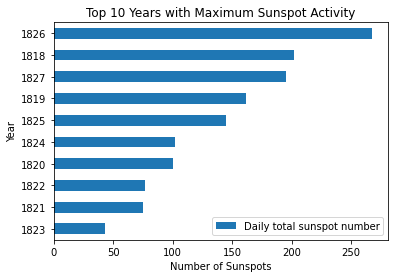

In [16]:
#plotting the top ten years with the highest maximum sunspots
ax = filtered_data[["Year","Daily total sunspot number"]] \
    .groupby("Year") \
    .agg("max") \
    .head(10) \
    .sort_values("Daily total sunspot number") \
    .plot(kind = "barh", title = "Top 10 Years with Maximum Sunspot Activity")
ax.set_xlabel("Number of Sunspots")

Text(0.5, 0, 'Number of Sunspots')

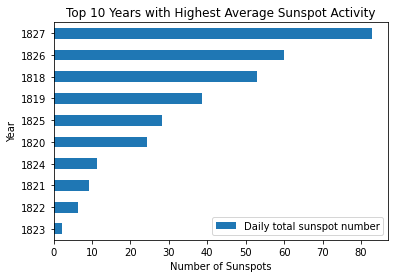

In [17]:
#plotting the top ten years with the highest average sunspots
ax = filtered_data[["Year","Daily total sunspot number"]] \
    .groupby("Year") \
    .agg("mean") \
    .head(10) \
    .sort_values("Daily total sunspot number") \
    .plot(kind = "barh", title = "Top 10 Years with Highest Average Sunspot Activity")
ax.set_xlabel("Number of Sunspots")

Text(0.5, 0, 'Number of Sunspots')

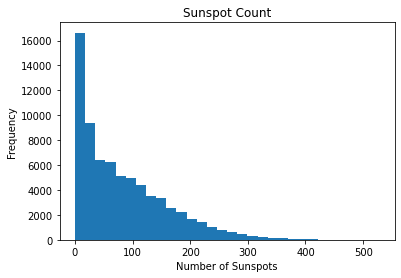

In [18]:
#plotting the distribution of sunspots
ax = filtered_data["Daily total sunspot number"].plot(kind = "hist", 
                                                      title = "Sunspot Count", 
                                                      bins = 30)
ax.set_xlabel("Number of Sunspots")

Text(0.5, 0, 'Standard Deviation')

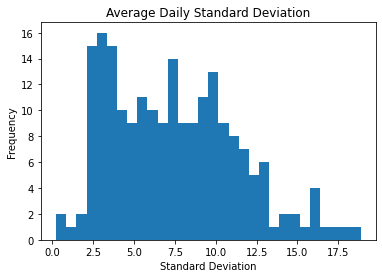

In [19]:
#Exploring the Standard Deviation distribution
ax = filtered_data[["Year", "Daily standard deviation"]] \
    .groupby("Year") \
    .agg("mean") \
    .plot(kind = "hist", 
          bins = 30, 
          title = "Average Daily Standard Deviation")
ax.get_legend().remove()
ax.set_xlabel("Standard Deviation")

In [20]:
#graphing the entire range of years with a slider for exploration with plotly
fig = go.Figure()

fig.add_trace(
    go.Scatter(x=filtered_data.index, y=filtered_data["Daily total sunspot number"], name = "Number of Sunspots"))

fig.add_trace(
    go.Scatter(x=filtered_data.index, y=filtered_data["Yearly Rolling Average"], name = "Yearly Rolling Average"))

fig.update_yaxes(title = "Number of Sunspots")
fig.update_xaxes(title = "Date")

fig.update_layout(hovermode="x unified", 
                  showlegend=False,
                  title = "Sunspot Activity",
                      xaxis=dict(
                        rangeslider=dict(
                        visible=True
                        ),
                    type="date"
                  ))

fig.show()

In [21]:
#Overlaying the approximate sun cycle of 11 years in order to compare the cycles against each other
fig = go.Figure()

#starting year of 1823 according to the above graph since that is the start of the first full cycle in the dataset
for i in range(1823, filtered_data["Year"].max(), 11):
    start_year = i
    end_year = i + 11
    
    # Subset data for current 11 year period
    subset = filtered_data[(filtered_data["Year"] >= start_year) & (filtered_data["Year"] < end_year)]
    subset.reset_index(inplace = True)
    
    # Add trace for current 11 year period
    fig.add_trace(go.Scatter(x=subset.index, y=subset["Yearly Rolling Average"], name=f"{start_year} - {end_year}"))

fig.update_yaxes(title = "Number of Sunspots")
fig.update_xaxes(showticklabels=False)

fig.update_layout(showlegend=False,
                  title = "Number of Sunspots (1823-2020) Overlay")

fig.update_traces(hovertemplate='Number of Sunspots: %{y}')

The above plot shows the relative sunspot activity over a general 11 year cycle. We can see that the 1955-1966 cycle had by far the highest amount of sunspot activity. While the 1834-1845 cycle had a fast increase but a lower overall amount of sunspots. This also has all missing data removed from the dataset.

In [22]:
#Using the statmodel seasonal decomposition function to break apart the time series
decompose_data = seasonal_decompose(data["Daily total sunspot number"], model = "additive")
    
#plotting each of the sunspot decompositions
fig = make_subplots(rows=2, cols=2, subplot_titles=("Observed", "Trend", "Seasonal", "Residuals"))

fig.add_trace(
go.Scatter(x = decompose_data.observed.index, y = decompose_data.observed, name = "Observed"),
row=1, col=1)

fig.add_trace(
go.Scatter(x = decompose_data.trend.index, y = decompose_data.trend, name = "Trend"),
row=1, col=2)

fig.add_trace(
go.Scatter(x = decompose_data.seasonal.index, y = decompose_data.seasonal, name = "Seasonal"),
row=2, col=1)

fig.add_trace(
go.Scatter(x = decompose_data.resid.index, y = decompose_data.resid, name = "Residuals"),
row=2, col=2)

fig.update_layout(hovermode="x unified", 
                  showlegend=False, 
                  title = "Time Series Decomposition")


fig.show()

## Building a Autoregressive model to fit the data

Building an AR model to start with using the PACF in order to determine lags needed. Rather than trying to predict daily values, we're going to use yearly averages.

In [23]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARMA
import numpy as np
from scipy import stats
from statsmodels.graphics.api import qqplot

In [24]:
#copying the dataframe and aggregating
yearly_data = filtered_data.groupby("Year").agg("mean").copy()

In [25]:
#coverting the index to a period index
yearly_data.index = pd.date_range("1818-01-01", periods=205, freq="Y")

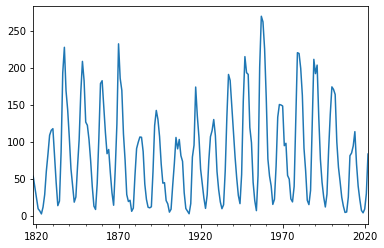

In [26]:
yearly_data["Daily total sunspot number"].plot(kind = "line")

# Plotting the Autocorreclation and Partial Autocorrelation in order to determine the lags to use

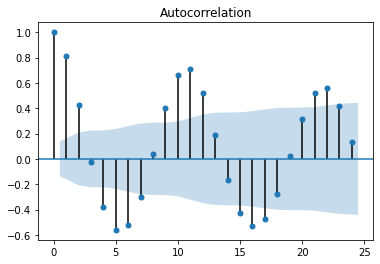

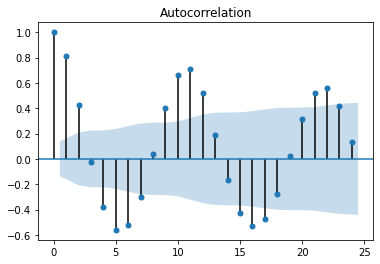

In [27]:
plot_acf(yearly_data["Daily total sunspot number"])

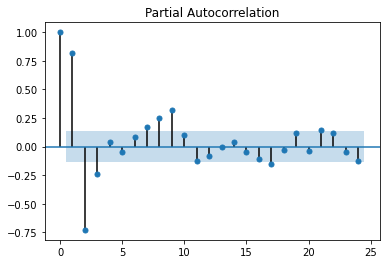

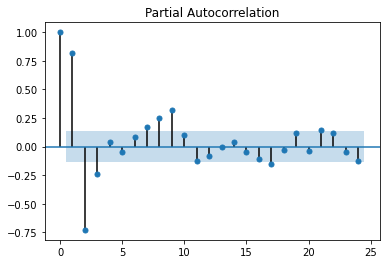

In [28]:
plot_pacf(yearly_data["Daily total sunspot number"])

From the lags we can see that the 1st, 2nd, 3rd, 4th and possibly the 8th and 9th are correlated to the first lag. Therefore we can chose a function that looks something like this:

$ f(x) = \beta_0 + \beta_1*x_{t-1} + \beta_2*x_{t-2} + \beta_3*x_{t-3} + \beta_4*x_{t-4} + ϵ$

We are going to start with the 4 lags that are possibly correlated and if we need to add more we can.

In [29]:
data.index.min()

Timestamp('1818-01-02 00:00:00')

In [30]:
model_data = yearly_data["Daily total sunspot number"]

train_data = model_data[:180]
test_data = model_data[180:]

In [31]:
model_data.head()

1818-12-31    52.938967
1819-12-31    38.534137
1820-12-31    24.232143
1821-12-31     9.180921
1822-12-31     6.254958
Freq: A-DEC, Name: Daily total sunspot number, dtype: float64

## Initiating and fitting the model

In [32]:
model = ARMA(train_data, (4,0))

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/arima_model.py:472: FutureWarning:


statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)




In [33]:
model_fit = model.fit()
print(model_fit.summary())

                                  ARMA Model Results                                  
Dep. Variable:     Daily total sunspot number   No. Observations:                  180
Model:                             ARMA(4, 0)   Log Likelihood                -841.732
Method:                               css-mle   S.D. of innovations             25.792
Date:                        Sun, 12 Feb 2023   AIC                           1695.463
Time:                                17:55:29   BIC                           1714.621
Sample:                            12-31-1818   HQIC                          1703.231
                                 - 12-31-1997                                         
                                       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const                               85.8610      4.851     17.701      0.000      76.354      95.368
a

We can see from the above summary that lags 1, 2, and 3 are significant because the p-value is less than 0.05. We would most likely exclude lag 4 in the future do to the fact that according to the p-value of 0.74 it is not considered significant.

## Using the fitted model to predict the testing data

In [34]:
predictions = model_fit.predict(180,205)
residuals = test_data - predictions

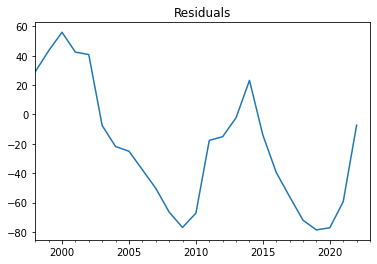

In [35]:
residuals.plot(kind = "line", title = "Residuals")

Text(0, 0.5, 'Number of Sunspots')

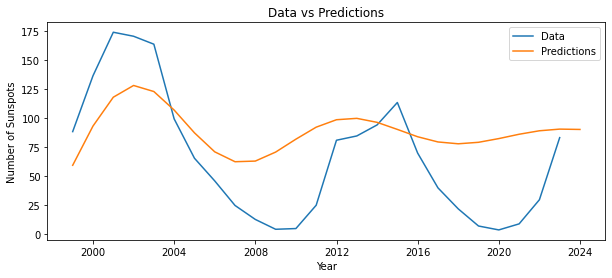

In [36]:
plt.figure(figsize=(10,4))

plt.plot(test_data)
plt.plot(predictions)

plt.legend(("Data", "Predictions"))

plt.title("Data vs Predictions")
plt.xlabel("Year")
plt.ylabel("Number of Sunspots")

In [37]:
print(f"Mean Absolute Percent Error: {round(np.mean(abs(residuals/test_data)), 4)}")
print(f"Root Mean Squared Error: {np.sqrt(np.mean(residuals**2))}")

Mean Absolute Percent Error: 3.605
Root Mean Squared Error: 47.4090714934382


In [38]:
stats.normaltest(residuals.dropna())

NormaltestResult(statistic=3.1743823748660853, pvalue=0.20449920573708805)

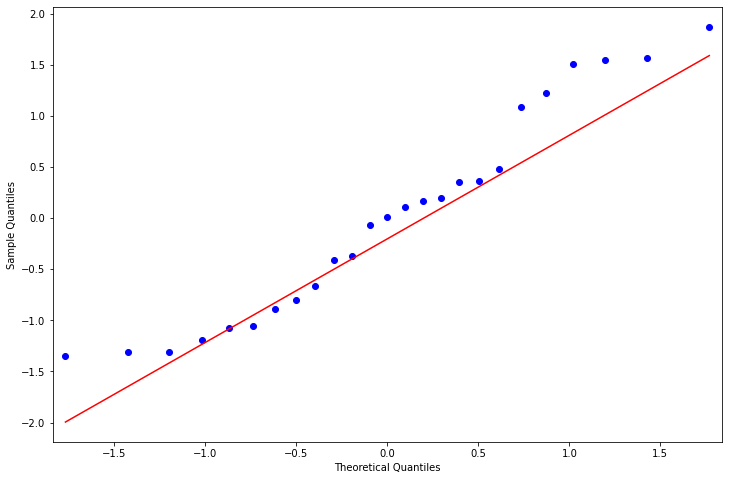

In [39]:
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111)
fig = qqplot(residuals.dropna(), line="q", ax=ax, fit=True)

There are several steps that we could take in order to improve the model potentially. The are as follows:

*   Reduce the amount of lags to 3 because we know that the 4th is not significant
*   Add additional lags based on the partial autocorrelation plot
*   Reduce the time period we are going to predict due to the fact that as we get further out in predictions the accuracy will go down.

The above options would be our next steps in order to try and improve the accuracy of the model. 


